In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.preprocessing.image import img_to_array
from skimage.metrics import structural_similarity as ssim
import cv2
import os
import re
from tqdm import tqdm
import keras 
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define constants
SIZE = 160
BATCH_SIZE = 32
EPOCHS = 50  # Increased epochs for better training
MAX_IMAGES = 5000  # You can try increasing this if resources allow

In [2]:
# Helper function for alphanumeric sorting
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

# Defining the size of the image
color_img = []
gray_img = []

# Path to color images
color_path = '/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'

# Function to process images recursively
def process_images_recursively(root_path, max_images=10000):
    global color_img, gray_img
    image_count = 0

    for root, _, files in os.walk(root_path):
        sorted_files = sorted_alphanumeric(files)
        for file_name in tqdm(sorted_files, desc=f"Processing folder: {root}"):
            # Stop if max_images is reached
            if image_count >= max_images:
                return

            # Full path to the image
            file_path = os.path.join(root, file_name)

            # Read color image
            color_image = cv2.imread(file_path, 1)
            if color_image is None:
                continue  # Skip if the file is not a valid image

            # Convert to RGB
            color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)
            # Resize image
            color_image = cv2.resize(color_image, (SIZE, SIZE))
            # Normalize and append to color images
            color_image = color_image.astype('float32') / 255.0
            color_img.append(img_to_array(color_image))

            # Convert to grayscale
            gray_image = cv2.cvtColor(color_image, cv2.COLOR_RGB2GRAY)
            # Expand dimensions to match the expected shape (H, W, 1)
            gray_image = np.expand_dims(gray_image, axis=-1)
            # Append to grayscale images
            gray_img.append(img_to_array(gray_image))

            image_count += 1

# Process the images
process_images_recursively(color_path, max_images=5000)

# Convert lists to NumPy arrays
color_img = np.array(color_img)
gray_img = np.array(gray_img)

# Print shapes to confirm processing
print("Color images shape:", color_img.shape)
print("Grayscale images shape:", gray_img.shape)

Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train: 0it [00:00, ?it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01531178: 100%|██████████| 1300/1300 [00:14<00:00, 89.79it/s] 
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02412080: 100%|██████████| 1300/1300 [00:14<00:00, 89.46it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02098413: 100%|██████████| 1300/1300 [00:13<00:00, 96.74it/s] 
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01797886:  85%|████████▍ | 1100/1300 [00:12<00:02, 85.68it/s]


Color images shape: (5000, 160, 160, 3)
Grayscale images shape: (5000, 160, 160, 1)


In [3]:
def plot_images(color, grayscale):
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plt.title('Color Image', color='green', fontsize=20)
    plt.imshow(color)
    plt.subplot(1, 2, 2)
    plt.title('Grayscale Image', color='black', fontsize=20)
    plt.imshow(grayscale.squeeze(), cmap='gray')  # Squeeze to remove extra dimension
    plt.show()

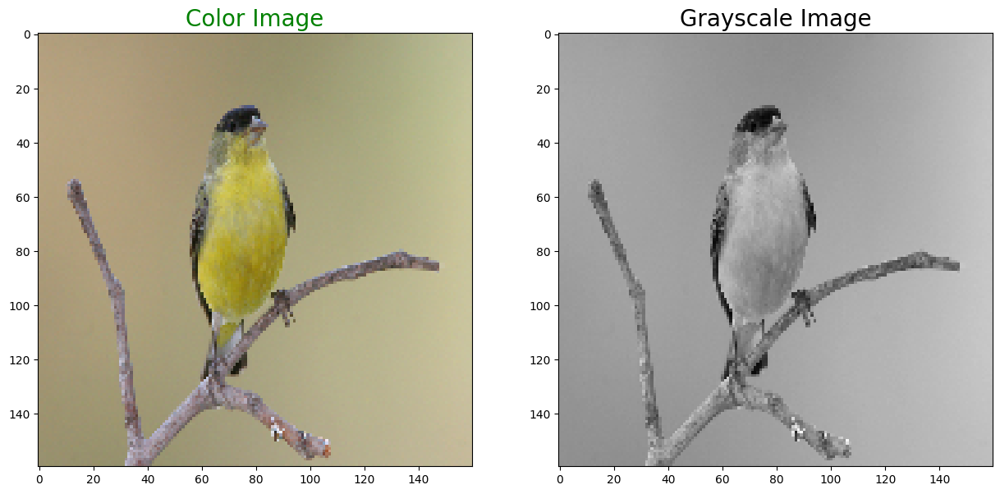

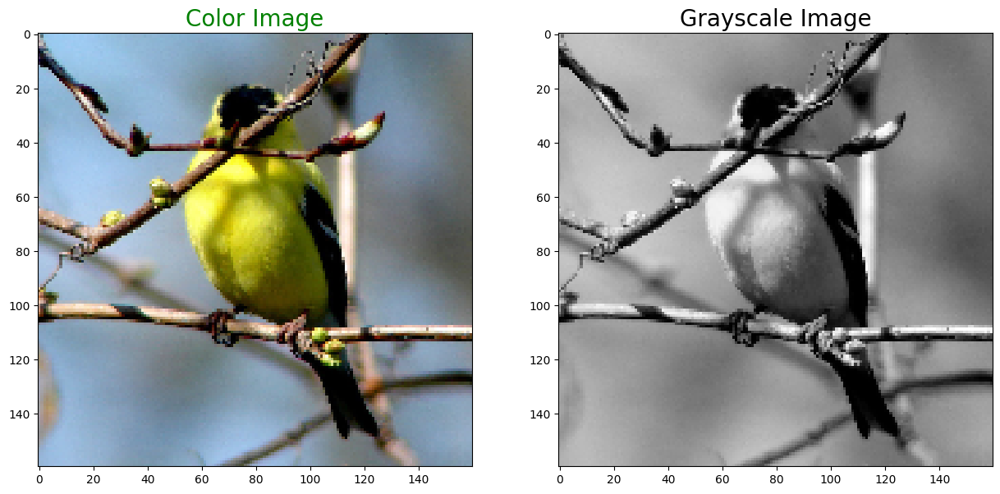

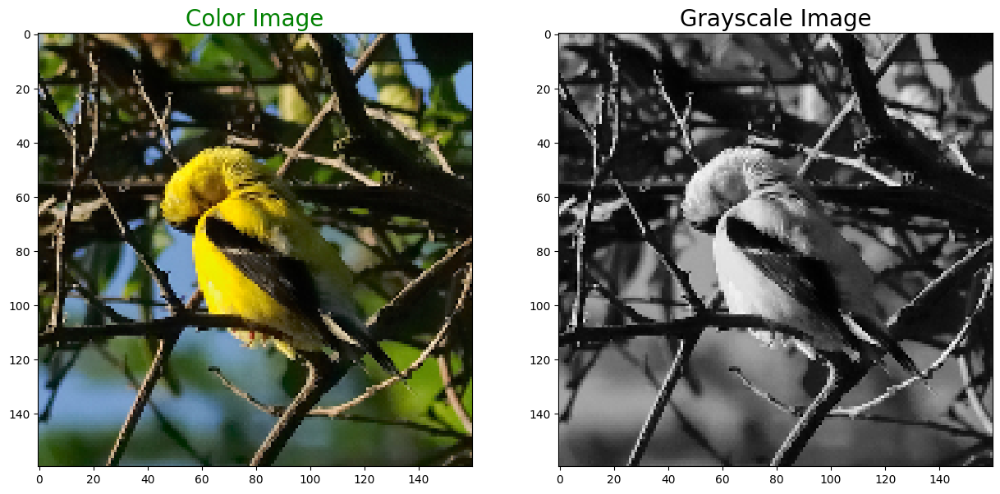

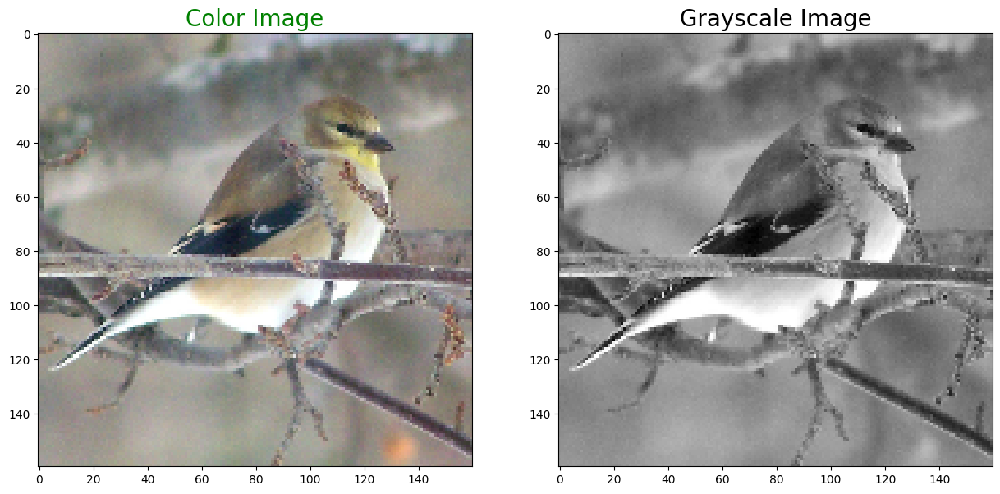

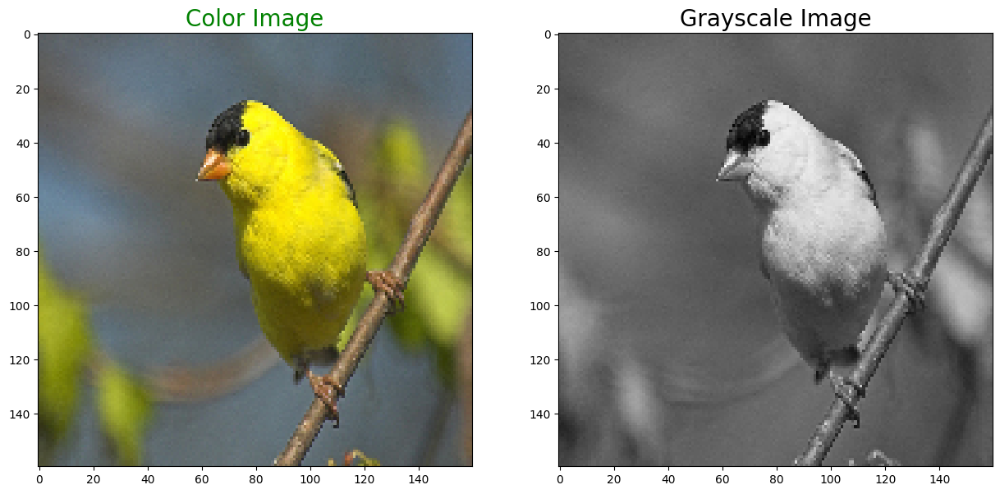

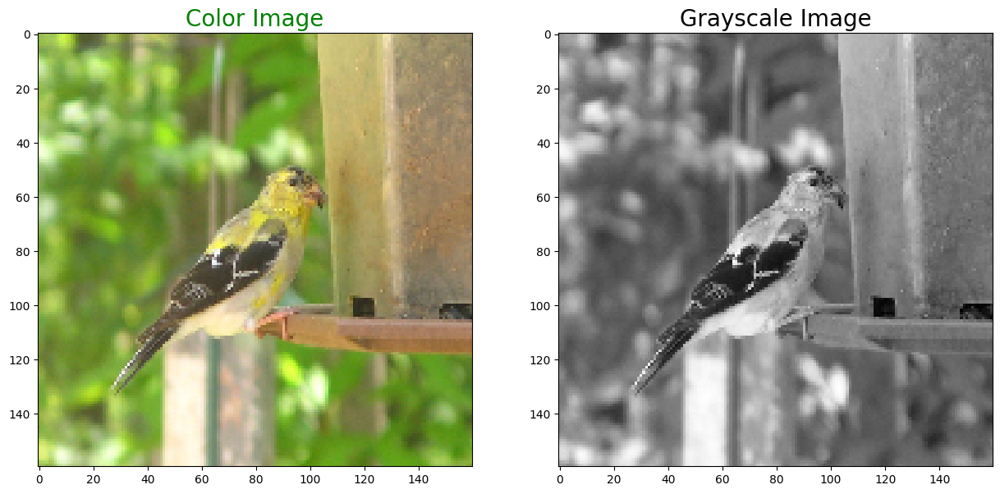

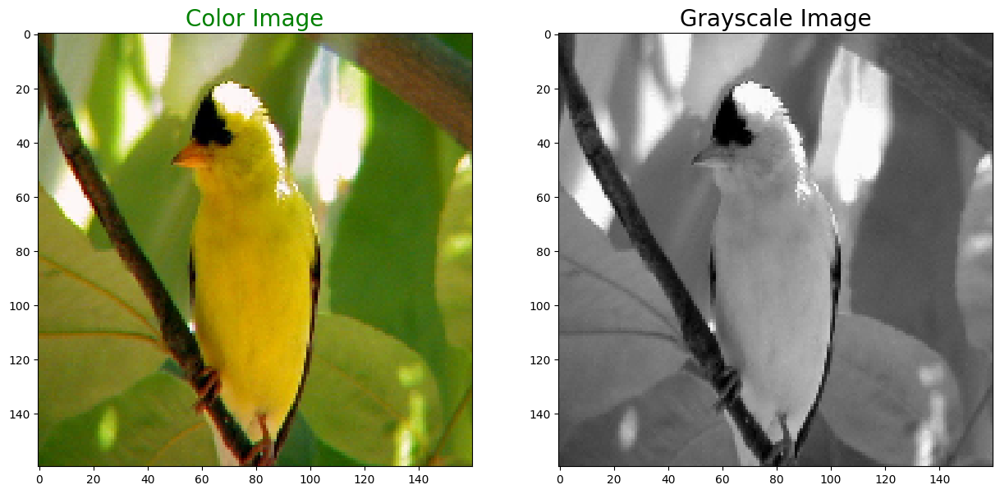

In [4]:
for i in range(3, 10):
    plot_images(color_img[i], gray_img[i])

In [5]:
x = len(gray_img)
train_g = gray_img[:int(0.8 * x)]
train_c = color_img[:int(0.8 * x)]

test_g = gray_img[int(0.8 * x):]
test_c = color_img[int(0.8 * x):]

train_g_rgb = np.repeat(train_g, 3, axis=-1)
test_g_rgb = np.repeat(test_g, 3, axis=-1)

print('Train gray image shape:', train_g.shape)
print('Train color image shape:', train_c.shape)
print('Test gray image shape:', test_g.shape)
print('Test color image shape:', test_c.shape)

Train gray image shape: (4000, 160, 160, 1)
Train color image shape: (4000, 160, 160, 3)
Test gray image shape: (1000, 160, 160, 1)
Test color image shape: (1000, 160, 160, 3)


In [6]:
# Simple Data Augmentation via tf.data
def augment(gr_img, clr_img):
    # Random flip
    if tf.random.uniform(()) > 0.5:
        gr_img = tf.image.flip_left_right(gr_img)
        clr_img = tf.image.flip_left_right(clr_img)
    
    # Random brightness
    gr_img = tf.image.random_brightness(gr_img, max_delta=0.05)
    clr_img = tf.image.random_brightness(clr_img, max_delta=0.05)
    
    # Ensure still in [0,1] range
    gr_img = tf.clip_by_value(gr_img, 0.0, 1.0)
    clr_img = tf.clip_by_value(clr_img, 0.0, 1.0)
    return gr_img, clr_img

In [7]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_g_rgb, train_c))
train_dataset = train_dataset.shuffle(buffer_size=1000).map(augment, num_parallel_calls=tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_tensor_slices((test_g_rgb, test_c))
test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [8]:
# Define model
def model():
    inputs = layers.Input(shape=[SIZE,SIZE,3])
    # Low-Level Features Network
    x = layers.Conv2D(64, (3,3), strides=2, padding='same', activation='relu')(inputs)
    x = layers.Conv2D(64, (3,3), padding='same', activation='relu')(x)
    
    x = layers.Conv2D(128, (3,3), strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, (3,3), padding='same', activation='relu')(x)
    
    x = layers.Conv2D(256, (3,3), strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(256, (3,3), padding='same', activation='relu')(x)
    low_level_features = x  # 20x20
    
    # Mid-Level Features Network
    mid = layers.Conv2D(256, (3,3), padding='same', activation='relu')(low_level_features)
    mid = layers.Conv2D(256, (3,3), padding='same', activation='relu')(mid)
    mid_level_features = mid  # 20x20
    
    # Global Features Network
    g = layers.Conv2D(512, (3,3), strides=2, padding='same', activation='relu')(low_level_features)
    g = layers.Conv2D(512, (3,3), padding='same', activation='relu')(g)
    g = layers.Conv2D(512, (3,3), strides=2, padding='same', activation='relu')(g)
    g = layers.Conv2D(512, (3,3), padding='same', activation='relu')(g)
    
    g = layers.Flatten()(g)
    g = layers.Dense(1024, activation='relu')(g)
    g = layers.Dense(512, activation='relu')(g)
    global_features = layers.Dense(256, activation='relu')(g)
    
    # Fusion Layer
    global_reshaped = layers.Reshape((1,1,256))(global_features)
    global_tiled = layers.Lambda(lambda x: tf.tile(x, [1, 20, 20, 1]))(global_reshaped)
    fused = layers.Concatenate(axis=-1)([mid_level_features, global_tiled])
    
    # Colorization Network (Upsampling)
    c = layers.Conv2DTranspose(256, (3,3), strides=2, padding='same', activation='relu')(fused) # 40x40
    c = layers.Conv2D(256, (3,3), padding='same', activation='relu')(c)
    
    c = layers.Conv2DTranspose(128, (3,3), strides=2, padding='same', activation='relu')(c) # 80x80
    c = layers.Conv2D(128, (3,3), padding='same', activation='relu')(c)
    
    c = layers.Conv2DTranspose(64, (3,3), strides=2, padding='same', activation='relu')(c) # 160x160
    c = layers.Conv2D(64, (3,3), padding='same', activation='relu')(c)
    
    output = layers.Conv2D(3, (1,1), padding='same', activation='sigmoid')(c)
    
    return tf.keras.Model(inputs=inputs, outputs=output)

In [9]:
vgg = VGG19(weights='imagenet', include_top=False)
vgg.trainable = False
perceptual_layer_name = 'block4_conv2'
perceptual_model = tf.keras.Model(inputs=vgg.input,
                                  outputs=vgg.get_layer(perceptual_layer_name).output)

def perceptual_loss(y_true, y_pred):
    y_true_scaled = tf.clip_by_value(y_true * 255.0, 0.0, 255.0)
    y_pred_scaled = tf.clip_by_value(y_pred * 255.0, 0.0, 255.0)
    y_true_proc = preprocess_input(y_true_scaled)
    y_pred_proc = preprocess_input(y_pred_scaled)
    y_true_features = perceptual_model(y_true_proc)
    y_pred_features = perceptual_model(y_pred_proc)
    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

def combined_loss(y_true, y_pred, alpha=1.0, beta=0.05):
    # Slightly reduced perceptual weight
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    p_loss = perceptual_loss(y_true, y_pred)
    return alpha * mse + beta * p_loss

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [10]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
NUM_DISPLAY_IMAGES = 5  # Number of images to display
sample_test_images = next(iter(test_dataset.take(1)))  # Take one batch from test_dataset
sample_grayscale, sample_color = sample_test_images

# If the batch size is less than NUM_DISPLAY_IMAGES, adjust accordingly
NUM_DISPLAY_IMAGES = min(NUM_DISPLAY_IMAGES, sample_grayscale.shape[0])

# Slice the first NUM_DISPLAY_IMAGES from the batch
sample_grayscale = sample_grayscale[:NUM_DISPLAY_IMAGES]
sample_color = sample_color[:NUM_DISPLAY_IMAGES]

# Define the custom callback
class ImagePredictionCallback(tf.keras.callbacks.Callback):
    def __init__(self, grayscale_images, color_images, interval=5):
        super(ImagePredictionCallback, self).__init__()
        self.grayscale_images = grayscale_images
        self.color_images = color_images
        self.interval = interval  # Interval of epochs to run the callback

    def on_epoch_end(self, epoch, logs=None):
        # Epoch numbers are zero-indexed
        if (epoch + 1) % self.interval == 0:
            print(f"\nEpoch {epoch + 1}: Generating prediction images...")
            # Perform predictions
            predictions = self.model.predict(self.grayscale_images)
            # Clip predictions to [0,1]
            predictions = np.clip(predictions, 0.0, 1.0)
            
            # Plot the images
            for i in range(NUM_DISPLAY_IMAGES):
                plt.figure(figsize=(15, 5))
                
                # Original Color Image
                plt.subplot(1, 3, 1)
                plt.title('Original Color Image', color='green', fontsize=15)
                plt.imshow(self.color_images[i])
                plt.axis('off')
                
                # Grayscale Image
                plt.subplot(1, 3, 2)
                plt.title('Input Grayscale Image', color='black', fontsize=15)
                plt.imshow(self.grayscale_images[i].numpy().squeeze(), cmap='gray')
                plt.axis('off')
                
                # Predicted Color Image
                plt.subplot(1, 3, 3)
                plt.title('Predicted Color Image', color='red', fontsize=15)
                plt.imshow(predictions[i])
                plt.axis('off')
                
                plt.show()


In [17]:
# Initialize the custom callback with sample images
image_prediction_callback = ImagePredictionCallback(
    grayscale_images=sample_grayscale,
    color_images=sample_color,
    interval=5  # Generate predictions every 5 epochs
)

# Update the callbacks list to include the custom callback
callbacks = [
    EarlyStopping(patience=10, restore_best_weights=True),
    ReduceLROnPlateau(patience=5, factor=0.5, verbose=1),
    image_prediction_callback  # Add the custom callback here
]

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),  # Smaller LR for more stable training
    loss=lambda y_true, y_pred: combined_loss(y_true, y_pred, alpha=1.0, beta=0.05),
    metrics=['mean_squared_error']
)

# Train the model with the updated callbacks
model.fit(
    train_dataset, 
    epochs=EPOCHS, 
    validation_data=test_dataset,
    callbacks=callbacks,
    verbose=1
)

# Save the final model
model.save(final_model_path)
print(f"Final model saved to {final_model_path}")

# Evaluation
loss, mse = model.evaluate(test_dataset, verbose=1)
print(f"Loss: {loss}, MSE: {mse}")

AttributeError: 'function' object has no attribute 'compile'

In [13]:
from skimage.metrics import structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

# Define accuracy calculation function
def calculate_metrics(color, predicted):
    """
    Calculate MSE, PSNR, and SSIM metrics for evaluation.
    """
    mse = np.mean((color - predicted) ** 2)
    psnr = 20 * np.log10(1.0 / np.sqrt(mse)) if mse > 0 else float('inf')
    ssim_value = ssim(
        color,
        predicted,
        win_size=3,  # Set to a smaller value if images are small
        channel_axis=-1,  # Specify the axis for color channels
        data_range=color.max() - color.min()
    )
    return mse, psnr, ssim_value

# Modified plotting function with accuracy metrics
def plot_images_with_metrics(color, grayscale, predicted, mse, psnr, ssim_value):
    """
    Plot images and display evaluation metrics.
    """
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 3, 1)
    plt.title('Color Image', color='green', fontsize=20)
    plt.imshow(color)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Grayscale Image', color='black', fontsize=20)
    plt.imshow(grayscale.squeeze(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title(f'Predicted Image\nMSE: {mse:.4f}\nPSNR: {psnr:.2f} dB\nSSIM: {ssim_value:.4f}', color='red', fontsize=16)
    plt.imshow(predicted)
    plt.axis('off')
    plt.show()

# Initialize results
results = []

# Loop to display images and their metrics
for i in range(100, 110):
    # Fix shape: convert (160, 160, 1) -> (160, 160, 3)
    gray_image = np.repeat(test_gray_image[i], 3, axis=-1)  # Duplicate channel to make it RGB
    gray_image = gray_image.reshape(1, SIZE, SIZE, 3)  # Add batch dimension

    # Predict
    predicted = model.predict(gray_image)

    # Ensure predicted output has the correct shape
    if predicted.shape[-1] == 1:  # If the output is single-channel
        predicted = np.repeat(predicted, 3, axis=-1)  # Convert to 3 channels

    predicted = predicted.squeeze()  # Remove batch dimension
    predicted = np.clip(predicted, 0.0, 1.0)  # Clip values to [0, 1]

    # Calculate metrics
    mse, psnr, ssim_value = calculate_metrics(test_color_image[i], predicted)
    results.append([mse, psnr, ssim_value])

    # Plot results
    plot_images_with_metrics(test_color_image[i], test_gray_image[i].squeeze(), predicted, mse, psnr, ssim_value)

# Calculate average metrics
average_metrics = np.mean(results, axis=0)
print(f"Average Metrics: MSE={average_metrics[0]:.4f}, PSNR={average_metrics[1]:.2f} dB, SSIM={average_metrics[2]:.4f}")


results = []
for i in range(0,len(test_color_image)):
    # Fix shape: convert (160, 160, 1) -> (160, 160, 3)
    gray_image = np.repeat(test_gray_image[i], 3, axis=-1)  # Duplicate channel to make it RGB
    gray_image = gray_image.reshape(1, SIZE, SIZE, 3)  # Add batch dimension

    # Predict
    predicted = model.predict(gray_image)

    # Ensure predicted output has the correct shape
    if predicted.shape[-1] == 1:  # If the output is single-channel
        predicted = np.repeat(predicted, 3, axis=-1)  # Convert to 3 channels

    predicted = predicted.squeeze()  # Remove batch dimension
    predicted = np.clip(predicted, 0.0, 1.0)  # Clip values to [0, 1]

    # Calculate metrics
    mse, psnr, ssim_value = calculate_metrics(test_color_image[i], predicted)
    results.append([mse, psnr, ssim_value])
# Calculate average metrics
average_metrics = np.mean(results, axis=0)
print(f"Average Metrics: MSE={average_metrics[0]:.4f}, PSNR={average_metrics[1]:.2f} dB, SSIM={average_metrics[2]:.4f}")

NameError: name 'test_gray_image' is not defined

In [ ]:
from keras import layers
def down(filters , kernel_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample


def up(filters, kernel_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    if dropout:
        upsample.dropout(0.2)
    upsample.add(keras.layers.LeakyReLU())
    return upsample

In [ ]:
def model():
    # Input (grayscale as 3-channel for consistency with existing code)
    inputs = layers.Input(shape=[160,160,3])
    
    #--------------------------------------------------------
    # Low-Level Features Network
    #--------------------------------------------------------
    # Extract features at multiple scales
    # Scale 1: 160x160 -> 80x80
    x = layers.Conv2D(64, (3,3), strides=2, padding='same', activation='relu')(inputs)
    x = layers.Conv2D(64, (3,3), padding='same', activation='relu')(x)
    
    # Scale 2: 80x80 -> 40x40
    x = layers.Conv2D(128, (3,3), strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, (3,3), padding='same', activation='relu')(x)
    
    # Scale 3: 40x40 -> 20x20
    x = layers.Conv2D(256, (3,3), strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(256, (3,3), padding='same', activation='relu')(x)
    low_level_features = x  # 20x20
    
    #--------------------------------------------------------
    # Mid-Level Features Network
    #--------------------------------------------------------
    # Further process the low-level features without downsampling
    # 20x20 -> 20x20
    mid = layers.Conv2D(256, (3,3), padding='same', activation='relu')(low_level_features)
    mid = layers.Conv2D(256, (3,3), padding='same', activation='relu')(mid)
    mid_level_features = mid  # 20x20
    
    #--------------------------------------------------------
    # Global Features Network (Classification Network)
    #--------------------------------------------------------
    # Further downsample mid-level features to capture global context
    # 20x20 -> 10x10
    g = layers.Conv2D(512, (3,3), strides=2, padding='same', activation='relu')(low_level_features)
    g = layers.Conv2D(512, (3,3), padding='same', activation='relu')(g)
    # 10x10 -> 5x5
    g = layers.Conv2D(512, (3,3), strides=2, padding='same', activation='relu')(g)
    g = layers.Conv2D(512, (3,3), padding='same', activation='relu')(g)
    
    # Flatten and add fully connected layers to get a global context vector
    g = layers.Flatten()(g)
    g = layers.Dense(1024, activation='relu')(g)
    g = layers.Dense(512, activation='relu')(g)
    global_features = layers.Dense(256, activation='relu')(g)  # global context vector
    
    #--------------------------------------------------------
    # Fusion Layer
    #--------------------------------------------------------
    # Replicate global features spatially and fuse with mid-level features
    # Mid-level: 20x20x256, Global: 256 -> reshape and tile to match spatial dims
    global_reshaped = layers.Reshape((1,1,256))(global_features)
    global_tiled = layers.Lambda(lambda x: tf.tile(x, [1, 20, 20, 1]))(global_reshaped)  # tile to 20x20
    fused = layers.Concatenate(axis=-1)([mid_level_features, global_tiled])  # 20x20x(256+256) = 20x20x512
    
    #--------------------------------------------------------
    # Colorization Network (Upsampling)
    #--------------------------------------------------------
    # Upsample fused features from 20x20 to 40x40
    c = layers.Conv2DTranspose(256, (3,3), strides=2, padding='same', activation='relu')(fused) # 40x40
    c = layers.Conv2D(256, (3,3), padding='same', activation='relu')(c)
    
    # 40x40 to 80x80
    c = layers.Conv2DTranspose(128, (3,3), strides=2, padding='same', activation='relu')(c) # 80x80
    c = layers.Conv2D(128, (3,3), padding='same', activation='relu')(c)
    
    # 80x80 to 160x160
    c = layers.Conv2DTranspose(64, (3,3), strides=2, padding='same', activation='relu')(c) # 160x160
    c = layers.Conv2D(64, (3,3), padding='same', activation='relu')(c)
    
    # Predict final output
    # Typically Iizuka et al. predict AB channels and combine with L, 
    # but here we produce 3-channel output for consistency with original code:
    output = layers.Conv2D(3, (1,1), padding='same', activation='sigmoid')(c)
    
    return tf.keras.Model(inputs=inputs, outputs=output)

In [ ]:
model = model()
model.summary()

In [ ]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
# Load VGG19 for perceptual loss (only once, outside model definition)
# We use block4_conv2 as a commonly used perceptual layer, but you can experiment with others.
vgg = VGG19(weights='imagenet', include_top=False)
vgg.trainable = False

# Choose an intermediate layer for perceptual features
perceptual_layer_name = 'block4_conv2'
perceptual_model = tf.keras.Model(inputs=vgg.input,
                                  outputs=vgg.get_layer(perceptual_layer_name).output)

def perceptual_loss(y_true, y_pred):
    # y_true, y_pred expected to be in [0,1]
    # Convert them to VGG19 expected format: scale to [0,255] and apply ImageNet preprocessing
    y_true_scaled = tf.clip_by_value(y_true * 255.0, 0.0, 255.0)
    y_pred_scaled = tf.clip_by_value(y_pred * 255.0, 0.0, 255.0)
    
    # Preprocess for VGG19 (which subtracts ImageNet mean values)
    y_true_proc = preprocess_input(y_true_scaled)
    y_pred_proc = preprocess_input(y_pred_scaled)
    
    # Extract features
    y_true_features = perceptual_model(y_true_proc)
    y_pred_features = perceptual_model(y_pred_proc)
    
    # Compute feature-wise MSE
    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

def combined_loss(y_true, y_pred, alpha=1.0, beta=0.1):
    # alpha controls pixel-wise MSE weight
    # beta controls perceptual loss weight
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    p_loss = perceptual_loss(y_true, y_pred)
    return alpha * mse + beta * p_loss

In [ ]:

# Define file path for the final model
final_model_path = "/kaggle/working/colorization_model_final.keras"  # Final model in Keras format

# Compile the model
# Example: 0.1 weight for perceptual loss, 1.0 for pixel-wise MSE
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss=lambda y_true, y_pred: combined_loss(y_true, y_pred, alpha=1.0, beta=0.1),
    metrics=['mean_squared_error']  # MSE as a metric for monitoring
)


# Train the model
model.fit(
    train_g_rgb, 
    train_c, 
    epochs=50, 
    batch_size=50, 
    verbose=1
)

# Save the final model
model.save(final_model_path)
print(f"Final model saved to {final_model_path}")

# Generate a downloadable link for the final model

In [ ]:
# Debugging model input shape
print("Model input shape:", model.input_shape)
print("Model output shape:", model.output_shape)

# Test predictions (optional debugging step)
predictions = model.predict(test_g_rgb)
print("Predictions shape:", predictions.shape)

# Run evaluation
loss, acc = model.evaluate(test_g_rgb, test_color_image, batch_size=32)
print(f"Loss: {loss}, Accuracy: {acc}")

In [ ]:
from skimage.metrics import structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

# Define accuracy calculation function
def calculate_metrics(color, predicted):
    """
    Calculate MSE, PSNR, and SSIM metrics for evaluation.
    """
    mse = np.mean((color - predicted) ** 2)
    psnr = 20 * np.log10(1.0 / np.sqrt(mse)) if mse > 0 else float('inf')
    ssim_value = ssim(
        color,
        predicted,
        win_size=3,  # Set to a smaller value if images are small
        channel_axis=-1,  # Specify the axis for color channels
        data_range=color.max() - color.min()
    )
    return mse, psnr, ssim_value

# Modified plotting function with accuracy metrics
def plot_images_with_metrics(color, grayscale, predicted, mse, psnr, ssim_value):
    """
    Plot images and display evaluation metrics.
    """
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 3, 1)
    plt.title('Color Image', color='green', fontsize=20)
    plt.imshow(color)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Grayscale Image', color='black', fontsize=20)
    plt.imshow(grayscale.squeeze(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title(f'Predicted Image\nMSE: {mse:.4f}\nPSNR: {psnr:.2f} dB\nSSIM: {ssim_value:.4f}', color='red', fontsize=16)
    plt.imshow(predicted)
    plt.axis('off')
    plt.show()

# Initialize results
results = []

# Loop to display images and their metrics
for i in range(100, 110):
    # Fix shape: convert (160, 160, 1) -> (160, 160, 3)
    gray_image = np.repeat(test_gray_image[i], 3, axis=-1)  # Duplicate channel to make it RGB
    gray_image = gray_image.reshape(1, SIZE, SIZE, 3)  # Add batch dimension

    # Predict
    predicted = model.predict(gray_image)

    # Ensure predicted output has the correct shape
    if predicted.shape[-1] == 1:  # If the output is single-channel
        predicted = np.repeat(predicted, 3, axis=-1)  # Convert to 3 channels

    predicted = predicted.squeeze()  # Remove batch dimension
    predicted = np.clip(predicted, 0.0, 1.0)  # Clip values to [0, 1]

    # Calculate metrics
    mse, psnr, ssim_value = calculate_metrics(test_color_image[i], predicted)
    results.append([mse, psnr, ssim_value])

    # Plot results
    plot_images_with_metrics(test_color_image[i], test_gray_image[i].squeeze(), predicted, mse, psnr, ssim_value)

# Calculate average metrics
average_metrics = np.mean(results, axis=0)
print(f"Average Metrics: MSE={average_metrics[0]:.4f}, PSNR={average_metrics[1]:.2f} dB, SSIM={average_metrics[2]:.4f}")


results = []
for i in range(0,len(test_color_image)):
    # Fix shape: convert (160, 160, 1) -> (160, 160, 3)
    gray_image = np.repeat(test_gray_image[i], 3, axis=-1)  # Duplicate channel to make it RGB
    gray_image = gray_image.reshape(1, SIZE, SIZE, 3)  # Add batch dimension

    # Predict
    predicted = model.predict(gray_image)

    # Ensure predicted output has the correct shape
    if predicted.shape[-1] == 1:  # If the output is single-channel
        predicted = np.repeat(predicted, 3, axis=-1)  # Convert to 3 channels

    predicted = predicted.squeeze()  # Remove batch dimension
    predicted = np.clip(predicted, 0.0, 1.0)  # Clip values to [0, 1]

    # Calculate metrics
    mse, psnr, ssim_value = calculate_metrics(test_color_image[i], predicted)
    results.append([mse, psnr, ssim_value])
# Calculate average metrics
average_metrics = np.mean(results, axis=0)
print(f"Average Metrics: MSE={average_metrics[0]:.4f}, PSNR={average_metrics[1]:.2f} dB, SSIM={average_metrics[2]:.4f}")

In [ ]:
print(f"Average Metrics: MSE={average_metrics[0]:.4f}, PSNR={average_metrics[1]:.2f} dB, SSIM={average_metrics[2]:.4f}")

In [5]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.preprocessing.image import img_to_array
from skimage.metrics import structural_similarity as ssim
import cv2
import os
import re
from tqdm import tqdm
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define constants
SIZE = 160
BATCH_SIZE = 32
EPOCHS = 100  # Increased epochs for better training
MAX_IMAGES = 5000  # 

In [6]:
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

# Defining the size of the image
color_img = []
gray_img = []

# Path to color images
color_path = '/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'

# Function to process images recursively
def process_images_recursively(root_path, max_images=10000):
    global color_img, gray_img
    image_count = 0

    for root, _, files in os.walk(root_path):
        sorted_files = sorted_alphanumeric(files)
        for file_name in tqdm(sorted_files, desc=f"Processing folder: {root}"):
            # Stop if max_images is reached
            if image_count >= max_images:
                return

            # Full path to the image
            file_path = os.path.join(root, file_name)

            # Read color image
            color_image = cv2.imread(file_path, 1)
            if color_image is None:
                continue  # Skip if the file is not a valid image

            # Convert to RGB
            color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)
            # Resize image
            color_image = cv2.resize(color_image, (SIZE, SIZE))
            # Normalize and append to color images
            color_image = color_image.astype('float32') / 255.0
            color_img.append(img_to_array(color_image))

            # Convert to grayscale
            gray_image = cv2.cvtColor(color_image, cv2.COLOR_RGB2GRAY)
            # Expand dimensions to match the expected shape (H, W, 1)
            gray_image = np.expand_dims(gray_image, axis=-1)
            # Append to grayscale images
            gray_img.append(img_to_array(gray_image))

            image_count += 1

# Process the images
process_images_recursively(color_path, max_images=5000)

Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train: 0it [00:00, ?it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01531178: 100%|██████████| 1300/1300 [00:13<00:00, 93.76it/s] 
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02412080: 100%|██████████| 1300/1300 [00:14<00:00, 90.54it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02098413: 100%|██████████| 1300/1300 [00:12<00:00, 101.75it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01797886:  85%|████████▍ | 1100/1300 [00:12<00:02, 89.05it/s]


Color images shape: (5000, 160, 160, 3)
Grayscale images shape: (5000, 160, 160, 1)


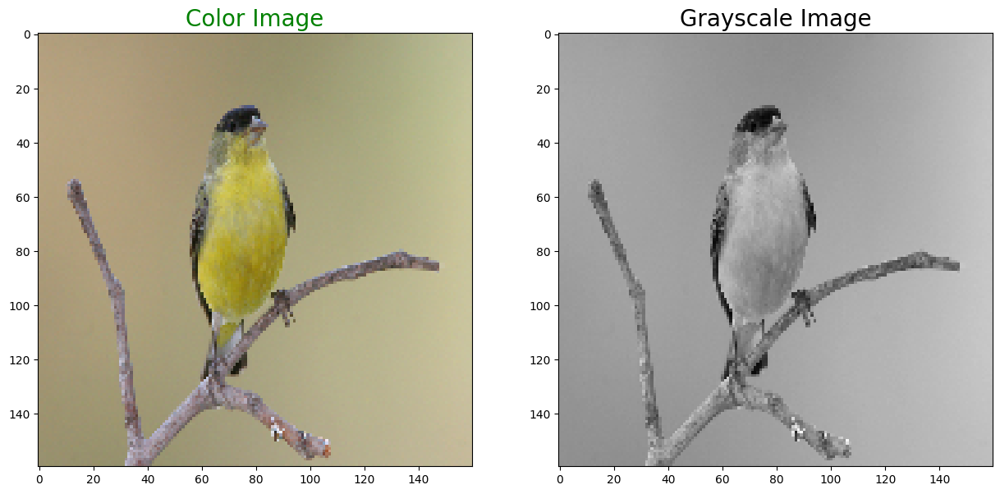

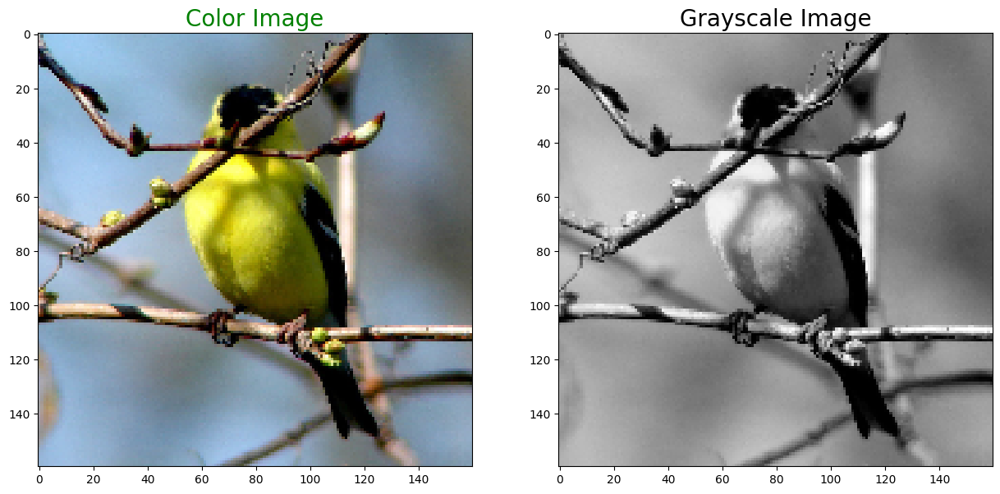

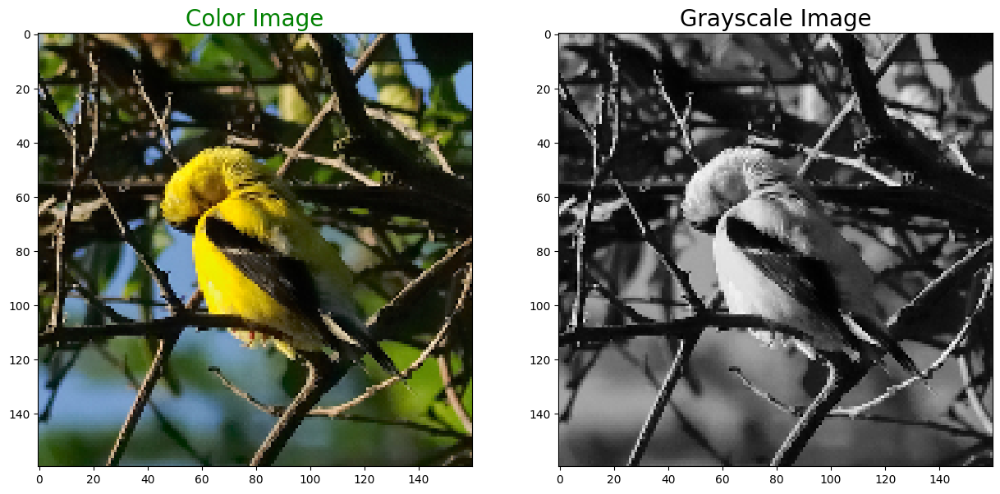

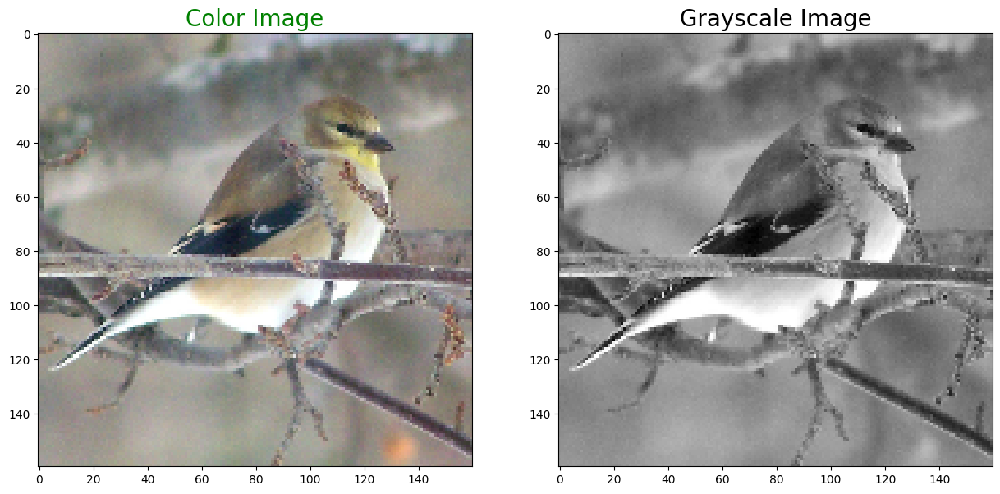

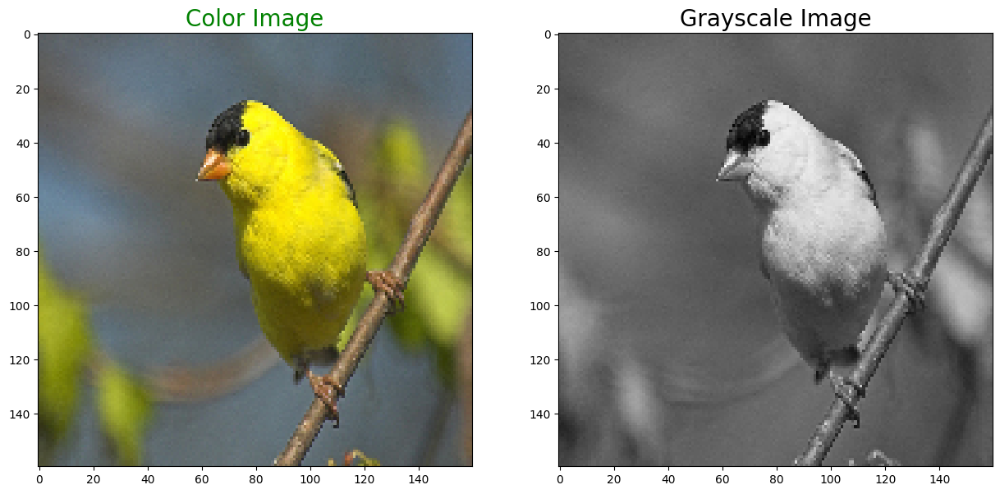

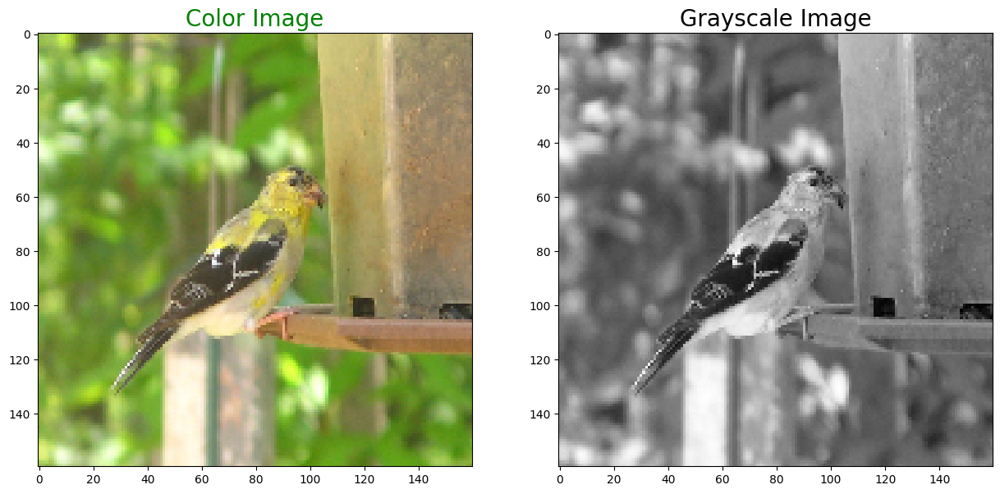

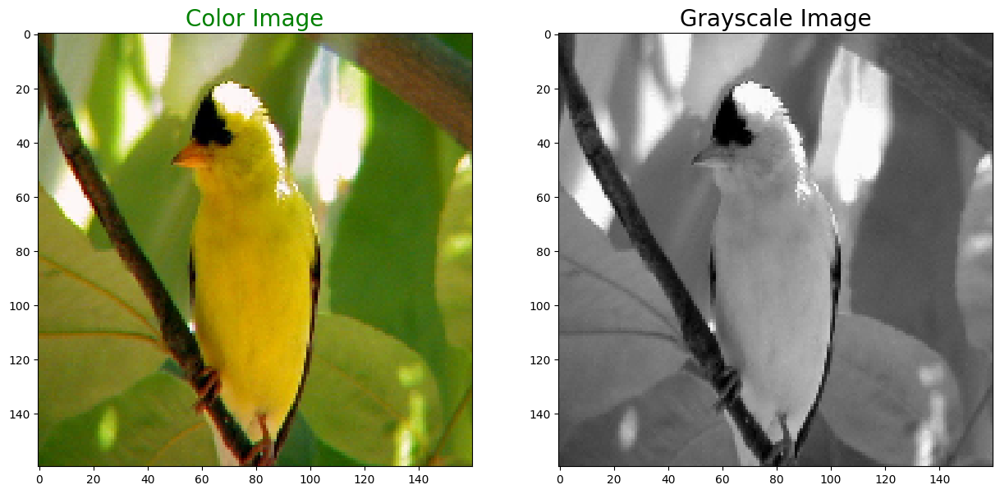

In [7]:
color_img = np.array(color_img)
gray_img = np.array(gray_img)

# Print shapes to confirm processing
print("Color images shape:", color_img.shape)
print("Grayscale images shape:", gray_img.shape)

# Plotting function for visualization
def plot_images(color, grayscale):
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plt.title('Color Image', color='green', fontsize=20)
    plt.imshow(color)
    plt.subplot(1, 2, 2)
    plt.title('Grayscale Image', color='black', fontsize=20)
    plt.imshow(grayscale.squeeze(), cmap='gray')  # Squeeze to remove extra dimension
    plt.show()

# Display some sample images
for i in range(3, 10):
    plot_images(color_img[i], gray_img[i])

In [8]:
# Split data into training and testing sets
x = len(gray_img)
train_g = gray_img[:int(0.8 * x)]
train_c = color_img[:int(0.8 * x)]

test_g = gray_img[int(0.8 * x):]
test_c = color_img[int(0.8 * x):]

train_g_rgb = np.repeat(train_g, 3, axis=-1)
test_g_rgb = np.repeat(test_g, 3, axis=-1)

print('Train gray image shape:', train_g.shape)
print('Train color image shape:', train_c.shape)
print('Test gray image shape:', test_g.shape)
print('Test color image shape:', test_c.shape)

Train gray image shape: (4000, 160, 160, 1)
Train color image shape: (4000, 160, 160, 3)
Test gray image shape: (1000, 160, 160, 1)
Test color image shape: (1000, 160, 160, 3)


In [9]:
# Simple Data Augmentation via tf.data
def augment(gr_img, clr_img):
    # Random flip
    if tf.random.uniform(()) > 0.5:
        gr_img = tf.image.flip_left_right(gr_img)
        clr_img = tf.image.flip_left_right(clr_img)
    
    # Random brightness
    gr_img = tf.image.random_brightness(gr_img, max_delta=0.05)
    clr_img = tf.image.random_brightness(clr_img, max_delta=0.05)
    
    # Ensure still in [0,1] range
    gr_img = tf.clip_by_value(gr_img, 0.0, 1.0)
    clr_img = tf.clip_by_value(clr_img, 0.0, 1.0)
    return gr_img, clr_img

# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((train_g_rgb, train_c))
train_dataset = train_dataset.shuffle(buffer_size=1000).map(augment, num_parallel_calls=tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_tensor_slices((test_g_rgb, test_c))
test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [10]:
# Define the model creation function with a unique name
def create_model():
    inputs = layers.Input(shape=[SIZE, SIZE, 3])
    # Low-Level Features Network
    x = layers.Conv2D(64, (3,3), strides=2, padding='same', activation='relu')(inputs)
    x = layers.Conv2D(64, (3,3), padding='same', activation='relu')(x)
    
    x = layers.Conv2D(128, (3,3), strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, (3,3), padding='same', activation='relu')(x)
    
    x = layers.Conv2D(256, (3,3), strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(256, (3,3), padding='same', activation='relu')(x)
    low_level_features = x  # 20x20
    
    # Mid-Level Features Network
    mid = layers.Conv2D(256, (3,3), padding='same', activation='relu')(low_level_features)
    mid = layers.Conv2D(256, (3,3), padding='same', activation='relu')(mid)
    mid_level_features = mid  # 20x20
    
    # Global Features Network
    g = layers.Conv2D(512, (3,3), strides=2, padding='same', activation='relu')(low_level_features)
    g = layers.Conv2D(512, (3,3), padding='same', activation='relu')(g)
    g = layers.Conv2D(512, (3,3), strides=2, padding='same', activation='relu')(g)
    g = layers.Conv2D(512, (3,3), padding='same', activation='relu')(g)
    
    g = layers.Flatten()(g)
    g = layers.Dense(1024, activation='relu')(g)
    g = layers.Dense(512, activation='relu')(g)
    global_features = layers.Dense(256, activation='relu')(g)
    
    # Fusion Layer
    global_reshaped = layers.Reshape((1,1,256))(global_features)
    global_tiled = layers.Lambda(lambda x: tf.tile(x, [1, 20, 20, 1]))(global_reshaped)
    fused = layers.Concatenate(axis=-1)([mid_level_features, global_tiled])
    
    # Colorization Network (Upsampling)
    c = layers.Conv2DTranspose(256, (3,3), strides=2, padding='same', activation='relu')(fused) # 40x40
    c = layers.Conv2D(256, (3,3), padding='same', activation='relu')(c)
    
    c = layers.Conv2DTranspose(128, (3,3), strides=2, padding='same', activation='relu')(c) # 80x80
    c = layers.Conv2D(128, (3,3), padding='same', activation='relu')(c)
    
    c = layers.Conv2DTranspose(64, (3,3), strides=2, padding='same', activation='relu')(c) # 160x160
    c = layers.Conv2D(64, (3,3), padding='same', activation='relu')(c)
    
    output = layers.Conv2D(3, (1,1), padding='same', activation='sigmoid')(c)
    
    return tf.keras.Model(inputs=inputs, outputs=output)

# Instantiate the model using the new function name
model_instance = create_model()
model_instance.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 80, 80,    │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 80, 80,    │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 40, 40,    │     73,856 │ conv2d_1[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 40, 40,    │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 20, 20,    │    295,168 │ conv2d_3[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 20, 20,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 10, 10,    │  1,180,160 │ conv2d_5[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 10, 10,    │  2,359,808 │ conv2d_8[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 5, 5, 512) │  2,359,808 │ conv2d_9[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 5, 5, 512) │  2,359,808 │ conv2d_10[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 12800)     │          0 │ conv2d_11[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 1024)      │ 13,108,224 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 512)       │    524,800 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 256)       │    131,328 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 20, 20,    │    590,080 │ conv2d_5[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 256) │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 20, 20,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 20, 20,    │          0 │ reshape[0][0]     │
│                     │ 256)              │            │                 

 Total params: 26,673,027 (101.75 MB)

 Trainable params: 26,673,027 (101.75 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
# Load VGG19 for perceptual loss (only once, outside model definition)
vgg = VGG19(weights='imagenet', include_top=False)
vgg.trainable = False
perceptual_layer_name = 'block4_conv2'
perceptual_model = tf.keras.Model(inputs=vgg.input,
                                  outputs=vgg.get_layer(perceptual_layer_name).output)

def perceptual_loss(y_true, y_pred):
    y_true_scaled = tf.clip_by_value(y_true * 255.0, 0.0, 255.0)
    y_pred_scaled = tf.clip_by_value(y_pred * 255.0, 0.0, 255.0)
    y_true_proc = preprocess_input(y_true_scaled)
    y_pred_proc = preprocess_input(y_pred_scaled)
    y_true_features = perceptual_model(y_true_proc)
    y_pred_features = perceptual_model(y_pred_proc)
    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

def combined_loss(y_true, y_pred, alpha=1.0, beta=0.05):
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    p_loss = perceptual_loss(y_true, y_pred)
    return alpha * mse + beta * p_loss

# Define the custom callback for displaying prediction images
class ImagePredictionCallback(tf.keras.callbacks.Callback):
    def __init__(self, grayscale_images, color_images, interval=5):
        super(ImagePredictionCallback, self).__init__()
        self.grayscale_images = grayscale_images
        self.color_images = color_images
        self.interval = interval  # Interval of epochs to run the callback

    def on_epoch_end(self, epoch, logs=None):
        # Epoch numbers are zero-indexed
        if (epoch + 1) % self.interval == 0:
            print(f"\nEpoch {epoch + 1}: Generating prediction images...")
            # Perform predictions
            predictions = self.model.predict(self.grayscale_images)
            # Clip predictions to [0,1]
            predictions = np.clip(predictions, 0.0, 1.0)
            
            # Plot the images
            for i in range(self.grayscale_images.shape[0]):
                plt.figure(figsize=(15, 5))
                
                # Original Color Image
                plt.subplot(1, 3, 1)
                plt.title('Original Color Image', color='green', fontsize=15)
                plt.imshow(self.color_images[i])
                plt.axis('off')
                
                # Grayscale Image
                plt.subplot(1, 3, 2)
                plt.title('Input Grayscale Image', color='black', fontsize=15)
                plt.imshow(self.grayscale_images[i].numpy().squeeze(), cmap='gray')
                plt.axis('off')
                
                # Predicted Color Image
                plt.subplot(1, 3, 3)
                plt.title('Predicted Color Image', color='red', fontsize=15)
                plt.imshow(predictions[i])
                plt.axis('off')
                
                plt.show()


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Epoch 1/100


I0000 00:00:1733674102.370763     109 service.cc:145] XLA service 0x7a7164004220 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733674102.370857     109 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1733674102.370864     109 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1733674141.925326     109 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_select_fusion_8', 16 bytes spill stores, 16 bytes spill loads

I0000 00:00:1733674141.937393     109 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


125/125 ━━━━━━━━━━━━━━━━━━━━ 123s 605ms/step - loss: 31111.5469 - mean_squared_error: 0.0673 - val_loss: 23610.3359 - val_mean_squared_error: 0.0631 - learning_rate: 1.0000e-04
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 73s 585ms/step - loss: 24307.6504 - mean_squared_error: 0.0626 - val_loss: 21038.8770 - val_mean_squared_error: 0.0633 - learning_rate: 1.0000e-04
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 73s 580ms/step - loss: 21955.8848 - mean_squared_error: 0.0607 - val_loss: 20084.8281 - val_mean_squared_error: 0.0652 - learning_rate: 1.0000e-04
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 72s 577ms/step - loss: 21022.2168 - mean_squared_error: 0.0589 - val_loss: 19321.7637 - val_mean_squared_error: 0.0661 - learning_rate: 1.0000e-04
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - loss: 20052.6875 - mean_squared_error: 0.0547
Epoch 5: Generating prediction images...
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


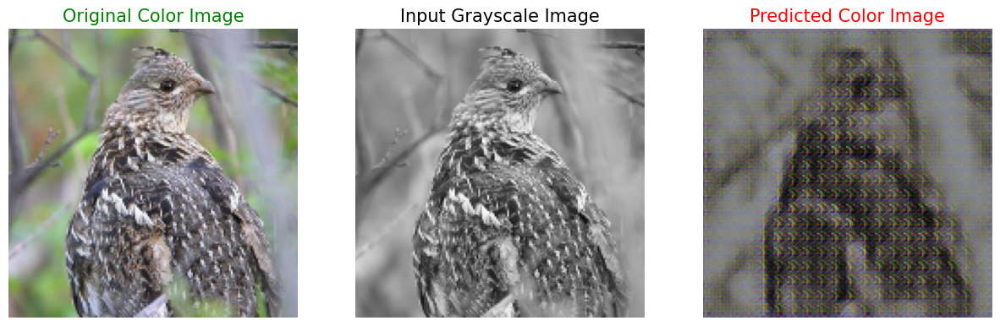

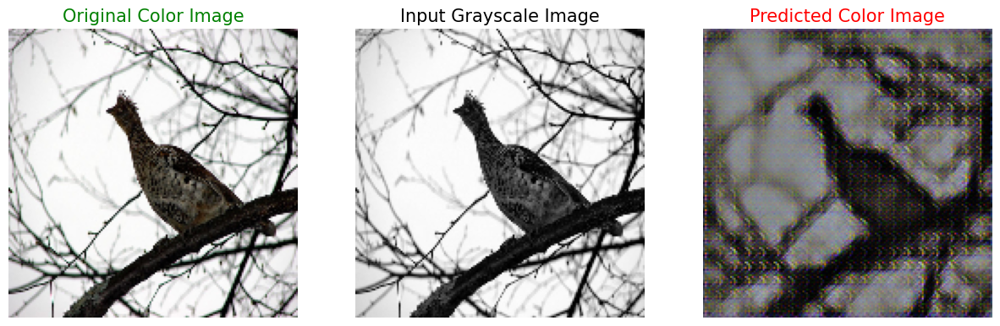

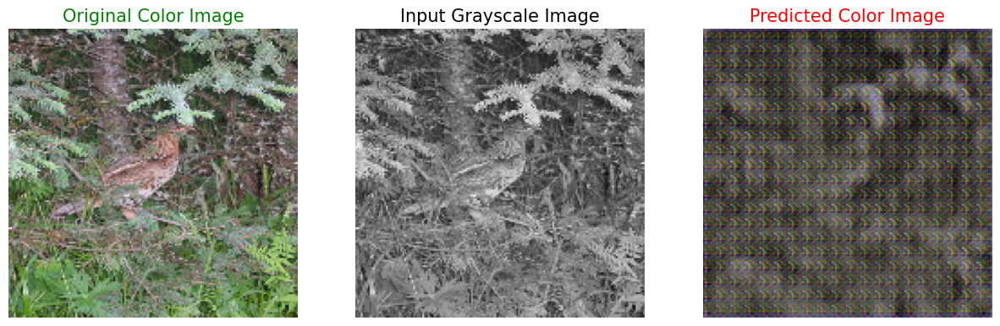

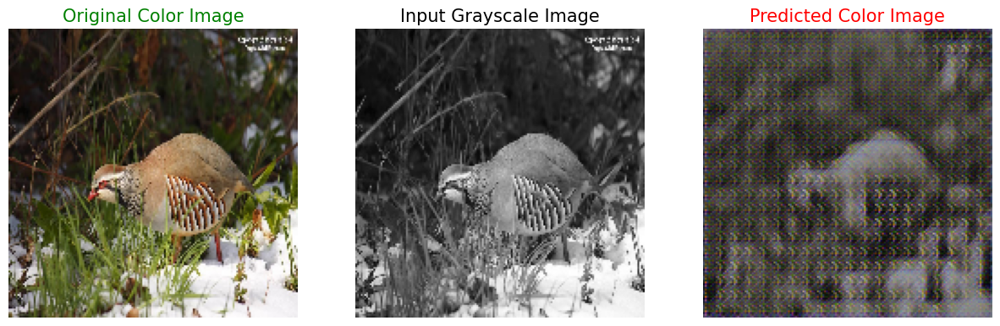

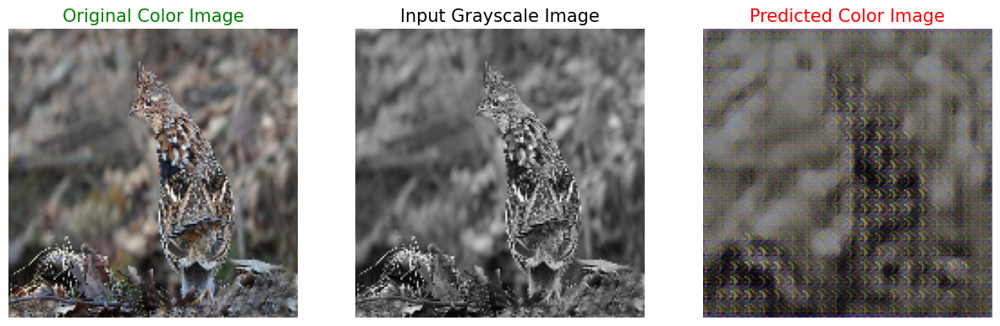

125/125 ━━━━━━━━━━━━━━━━━━━━ 80s 644ms/step - loss: 20045.2285 - mean_squared_error: 0.0547 - val_loss: 18187.2324 - val_mean_squared_error: 0.0624 - learning_rate: 1.0000e-04
Epoch 6/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 73s 582ms/step - loss: 18478.2617 - mean_squared_error: 0.0452 - val_loss: 16859.4297 - val_mean_squared_error: 0.0497 - learning_rate: 1.0000e-04
Epoch 7/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 72s 579ms/step - loss: 17018.9590 - mean_squared_error: 0.0367 - val_loss: 16309.3701 - val_mean_squared_error: 0.0396 - learning_rate: 1.0000e-04
Epoch 8/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 73s 584ms/step - loss: 15946.5977 - mean_squared_error: 0.0329 - val_loss: 15410.2021 - val_mean_squared_error: 0.0391 - learning_rate: 1.0000e-04
Epoch 9/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 72s 579ms/step - loss: 14890.5400 - mean_squared_error: 0.0296 - val_loss: 14992.1230 - val_mean_squared_error: 0.0291 - learning_rate: 1.0000e-04
Epoch 10/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - loss: 14220.29

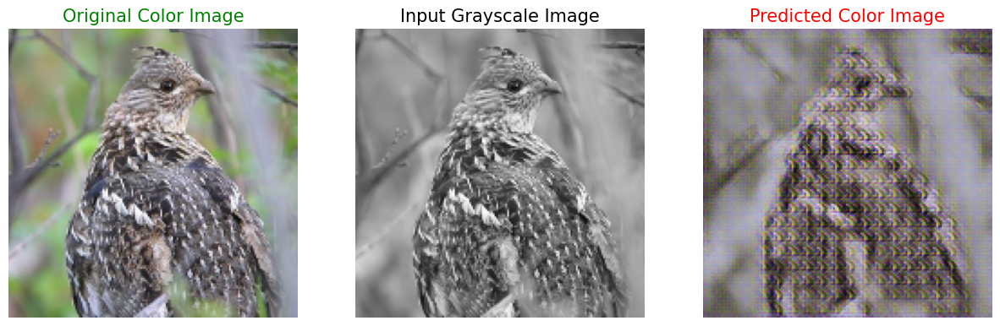

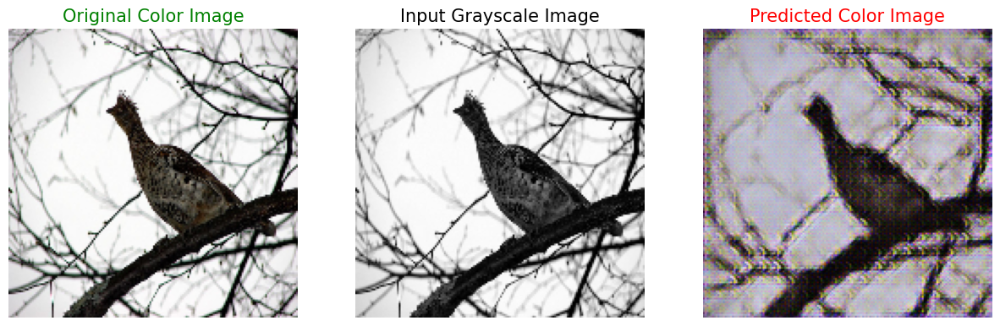

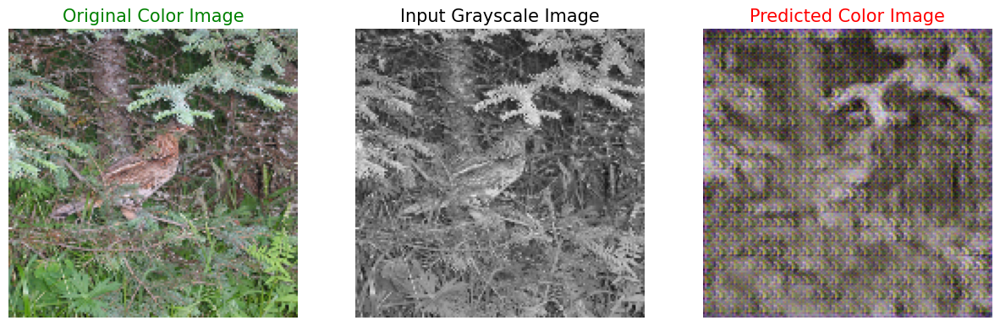

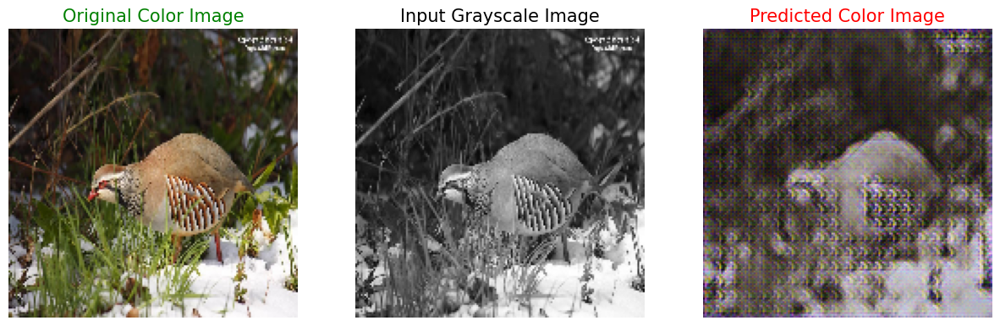

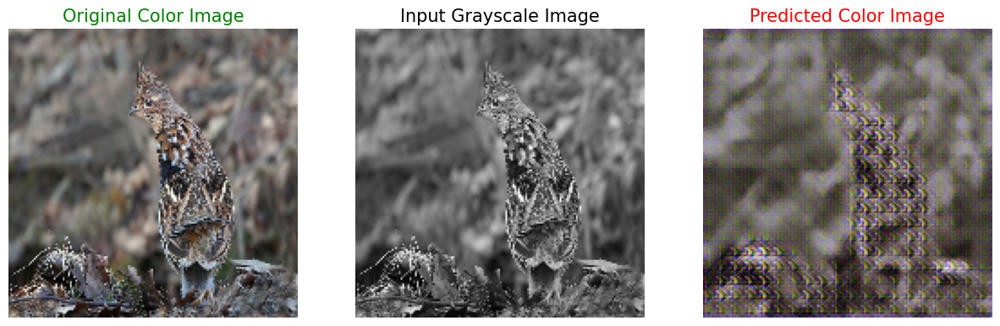

125/125 ━━━━━━━━━━━━━━━━━━━━ 76s 605ms/step - loss: 14216.2949 - mean_squared_error: 0.0278 - val_loss: 14275.4131 - val_mean_squared_error: 0.0298 - learning_rate: 1.0000e-04
Epoch 11/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 73s 584ms/step - loss: 13565.0771 - mean_squared_error: 0.0259 - val_loss: 13939.8926 - val_mean_squared_error: 0.0334 - learning_rate: 1.0000e-04
Epoch 12/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 72s 580ms/step - loss: 13057.7559 - mean_squared_error: 0.0251 - val_loss: 13467.2900 - val_mean_squared_error: 0.0293 - learning_rate: 1.0000e-04
Epoch 13/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 73s 584ms/step - loss: 12689.0430 - mean_squared_error: 0.0240 - val_loss: 13247.3740 - val_mean_squared_error: 0.0274 - learning_rate: 1.0000e-04
Epoch 14/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 73s 582ms/step - loss: 12396.6758 - mean_squared_error: 0.0235 - val_loss: 12930.9805 - val_mean_squared_error: 0.0253 - learning_rate: 1.0000e-04
Epoch 15/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - loss: 1203

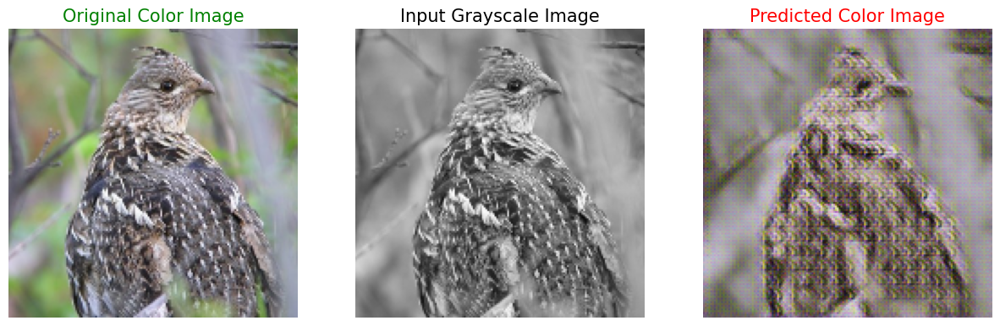

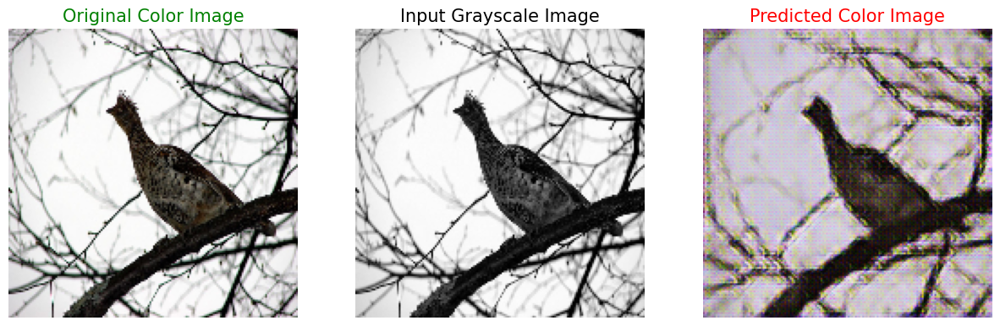

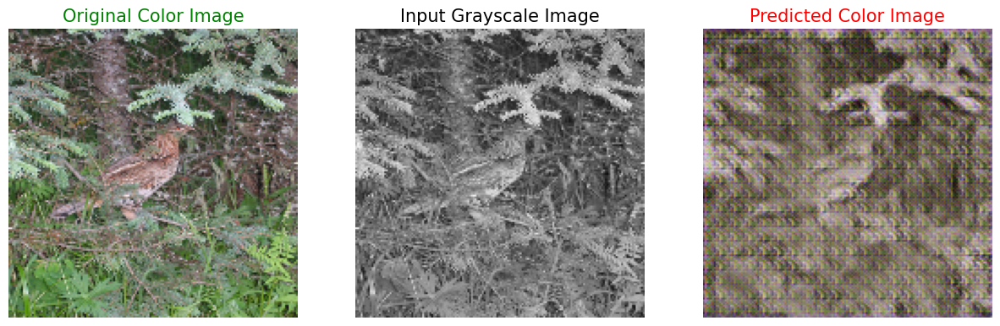

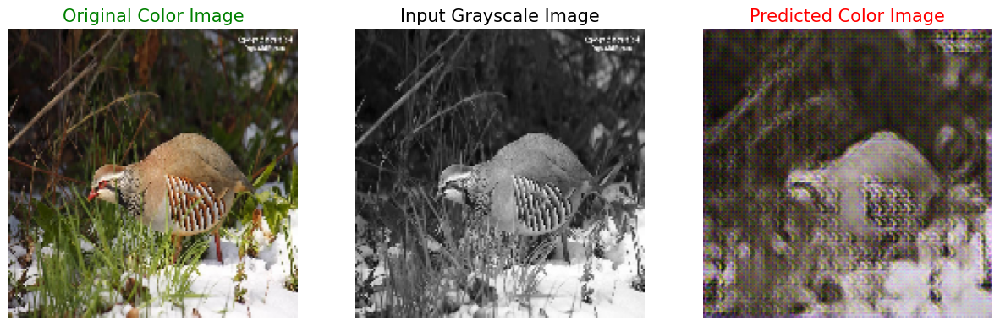

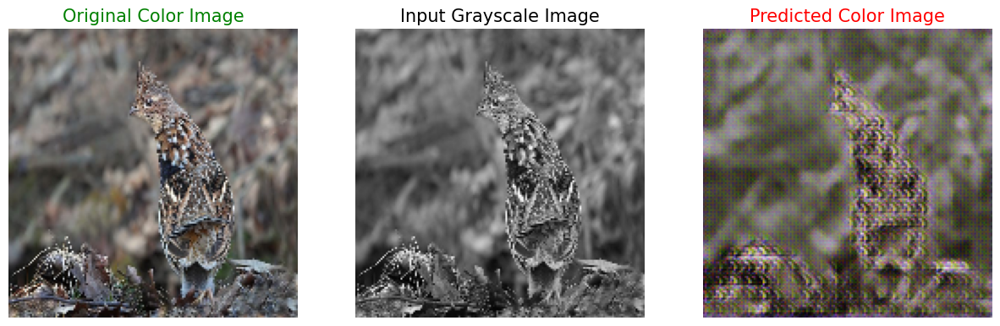

125/125 ━━━━━━━━━━━━━━━━━━━━ 75s 602ms/step - loss: 12037.2705 - mean_squared_error: 0.0229 - val_loss: 12726.8428 - val_mean_squared_error: 0.0248 - learning_rate: 1.0000e-04
Epoch 16/100
 16/125 ━━━━━━━━━━━━━━━━━━━━ 55s 513ms/step - loss: 12515.8574 - mean_squared_error: 0.0243

In [ ]:
# Select a fixed set of test images for consistent monitoring
NUM_DISPLAY_IMAGES = 5  # Number of images to display
sample_test_images = next(iter(test_dataset.take(1)))  # Take one batch from test_dataset
sample_grayscale, sample_color = sample_test_images

# If the batch size is less than NUM_DISPLAY_IMAGES, adjust accordingly
NUM_DISPLAY_IMAGES = min(NUM_DISPLAY_IMAGES, sample_grayscale.shape[0])

# Slice the first NUM_DISPLAY_IMAGES from the batch
sample_grayscale = sample_grayscale[:NUM_DISPLAY_IMAGES]
sample_color = sample_color[:NUM_DISPLAY_IMAGES]

# Initialize the custom callback with sample images
image_prediction_callback = ImagePredictionCallback(
    grayscale_images=sample_grayscale,
    color_images=sample_color,
    interval=5  # Generate predictions every 5 epochs
)

# Update the callbacks list to include the custom callback
callbacks = [
    EarlyStopping(patience=10, restore_best_weights=True),
    ReduceLROnPlateau(patience=5, factor=0.5, verbose=1),
    image_prediction_callback  # Add the custom callback here
]

# Define file path for the final model
final_model_path = "/kaggle/working/colorization_model_final.keras"  # Final model in Keras format

# Compile the model_instance
model_instance.compile(
    optimizer=Adam(learning_rate=1e-4),  # Smaller LR for more stable training
    loss=lambda y_true, y_pred: combined_loss(y_true, y_pred, alpha=1.0, beta=0.05),
    metrics=['mean_squared_error']
)

# Train the model with the updated callbacks
model_instance.fit(
    train_dataset, 
    epochs=EPOCHS, 
    validation_data=test_dataset,
    callbacks=callbacks,
    verbose=1
)

# Save the final model
model_instance.save(final_model_path)
print(f"Final model saved to {final_model_path}")

# Evaluation
loss, mse = model_instance.evaluate(test_dataset, verbose=1)
print(f"Loss: {loss}, MSE: {mse}")


In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.preprocessing.image import img_to_array
from skimage.metrics import structural_similarity as ssim
import cv2
import os
import re
from tqdm import tqdm
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import pandas as pd

# Define constants
SIZE = 160
BATCH_SIZE = 32
EPOCHS = 100
MAX_IMAGES = 5000

# Helper function for alphanumeric sorting
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

# Initialize image lists
color_img = []
gray_img = []

# Path to color images
color_path = '/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'

# Function to process images
def process_images_recursively(root_path, max_images=10000):
    global color_img, gray_img
    image_count = 0

    for root, _, files in os.walk(root_path):
        sorted_files = sorted_alphanumeric(files)
        for file_name in tqdm(sorted_files, desc=f"Processing folder: {root}"):
            if image_count >= max_images:
                return

            file_path = os.path.join(root, file_name)
            color_image = cv2.imread(file_path, 1)
            if color_image is None:
                continue

            color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)
            color_image = cv2.resize(color_image, (SIZE, SIZE))
            color_image = color_image.astype('float32') / 255.0
            color_img.append(img_to_array(color_image))

            gray_image = cv2.cvtColor(color_image, cv2.COLOR_RGB2GRAY)
            gray_image = gray_image.astype('float32') / 255.0
            gray_image = np.expand_dims(gray_image, axis=-1)
            gray_img.append(img_to_array(gray_image))

            image_count += 1

# Process images
process_images_recursively(color_path, max_images=5000)

Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train: 0it [00:00, ?it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01531178: 100%|██████████| 1300/1300 [00:15<00:00, 82.41it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02412080: 100%|██████████| 1300/1300 [00:15<00:00, 84.90it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n02098413: 100%|██████████| 1300/1300 [00:14<00:00, 90.85it/s]
Processing folder: /kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01797886:  85%|████████▍ | 1100/1300 [00:14<00:02, 77.34it/s]


In [2]:
# Convert to NumPy arrays
color_img = np.array(color_img)
gray_img = np.array(gray_img)

# Split into training and testing
x = len(gray_img)
train_g = gray_img[:int(0.8 * x)]
train_c = color_img[:int(0.8 * x)]
test_g = gray_img[int(0.8 * x):]
test_c = color_img[int(0.8 * x):]

train_g_rgb = np.repeat(train_g, 3, axis=-1)
test_g_rgb = np.repeat(test_g, 3, axis=-1)

print('Train gray image shape:', train_g.shape)
print('Train color image shape:', train_c.shape)
print('Test gray image shape:', test_g.shape)
print('Test color image shape:', test_c.shape)

Train gray image shape: (4000, 160, 160, 1)
Train color image shape: (4000, 160, 160, 3)
Test gray image shape: (1000, 160, 160, 1)
Test color image shape: (1000, 160, 160, 3)


In [3]:
def augment(gr_img, clr_img):
    if tf.random.uniform(()) > 0.5:
        gr_img = tf.image.flip_left_right(gr_img)
        clr_img = tf.image.flip_left_right(clr_img)
    
    gr_img = tf.image.random_brightness(gr_img, max_delta=0.05)
    clr_img = tf.image.random_brightness(clr_img, max_delta=0.05)
    
    gr_img = tf.clip_by_value(gr_img, 0.0, 1.0)
    clr_img = tf.clip_by_value(clr_img, 0.0, 1.0)
    return gr_img, clr_img

train_dataset = tf.data.Dataset.from_tensor_slices((train_g_rgb, train_c))
train_dataset = train_dataset.shuffle(buffer_size=1000).map(augment, num_parallel_calls=tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_tensor_slices((test_g_rgb, test_c))
test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [4]:
# Model Creation Function
def create_model():
    inputs = layers.Input(shape=[SIZE, SIZE, 3])
    # Encoder
    c1 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(inputs)
    c1 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(c1)
    p1 = layers.MaxPooling2D((2,2))(c1)
    
    c2 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(p1)
    c2 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(c2)
    p2 = layers.MaxPooling2D((2,2))(c2)
    
    c3 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(p2)
    c3 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(c3)
    p3 = layers.MaxPooling2D((2,2))(c3)
    
    # Bottleneck
    c4 = layers.Conv2D(512, (3,3), padding='same', activation='relu')(p3)
    c4 = layers.Conv2D(512, (3,3), padding='same', activation='relu')(c4)
    
    # Decoder
    u5 = layers.UpSampling2D((2,2))(c4)
    u5 = layers.Conv2D(256, (2,2), padding='same', activation='relu')(u5)
    merge5 = layers.concatenate([c3, u5], axis=3)
    c5 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(merge5)
    c5 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(c5)
    
    u6 = layers.UpSampling2D((2,2))(c5)
    u6 = layers.Conv2D(128, (2,2), padding='same', activation='relu')(u6)
    merge6 = layers.concatenate([c2, u6], axis=3)
    c6 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(merge6)
    c6 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(c6)
    
    u7 = layers.UpSampling2D((2,2))(c6)
    u7 = layers.Conv2D(64, (2,2), padding='same', activation='relu')(u7)
    merge7 = layers.concatenate([c1, u7], axis=3)
    c7 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(merge7)
    c7 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(c7)
    
    outputs = layers.Conv2D(3, (1,1), activation='sigmoid')(c7)
    
    return Model(inputs, outputs)

# Instantiate the model
model_instance = create_model()
model_instance.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 160, 160,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 160, 160,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 80, 80,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 80, 80,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 80, 80,    │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 40, 40,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 40, 40,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 40, 40,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 20, 20,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 20, 20,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 20, 20,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 40, 40,    │          0 │ conv2d_7[0][0]    │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 40, 40,    │    524,544 │ up_sampling2d[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 40, 40,    │          0 │ conv2d_5[0][0],   │
│ (Concatenate)       │ 512)              │            │ conv2d_8[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 40, 40,    │  1,179,904 │ concatenate[0][0] │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 40, 40,    │    590,080 │ conv2d_9[0][0]  

 Total params: 7,697,475 (29.36 MB)

 Trainable params: 7,697,475 (29.36 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
# Perceptual Loss Setup
vgg = VGG19(weights='imagenet', include_top=False, input_shape=(SIZE, SIZE, 3))
vgg.trainable = False
perceptual_layer_name = 'block4_conv2'
perceptual_model = Model(inputs=vgg.input, outputs=vgg.get_layer(perceptual_layer_name).output)

def perceptual_loss(y_true, y_pred):
    y_true_scaled = tf.clip_by_value(y_true * 255.0, 0.0, 255.0)
    y_pred_scaled = tf.clip_by_value(y_pred * 255.0, 0.0, 255.0)
    y_true_proc = preprocess_input(y_true_scaled)
    y_pred_proc = preprocess_input(y_pred_scaled)
    y_true_features = perceptual_model(y_true_proc)
    y_pred_features = perceptual_model(y_pred_proc)
    return tf.reduce_mean(tf.square(y_true_features - y_pred_features)) / (SIZE * SIZE)

def combined_loss(y_true, y_pred, alpha=1.0, beta=0.05):
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    p_loss = perceptual_loss(y_true, y_pred)
    return alpha * mse + beta * p_loss

# Metrics Calculation
def calculate_metrics(color, predicted):
    mse = np.mean((color - predicted) ** 2)
    psnr = 20 * np.log10(1.0 / np.sqrt(mse)) if mse > 0 else float('inf')
    ssim_value = ssim(
        color,
        predicted,
        win_size=3,
        channel_axis=-1,
        data_range=color.max() - color.min()
    )
    return mse, psnr, ssim_value

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [6]:
# Define EnhancedImagePredictionCallback with metrics logging
class EnhancedImagePredictionCallback(tf.keras.callbacks.Callback):
    def __init__(self, grayscale_images, color_images, interval=5, save_dir='predictions'):
        super(EnhancedImagePredictionCallback, self).__init__()
        self.grayscale_images = grayscale_images
        self.color_images = color_images
        self.interval = interval
        self.save_dir = save_dir
        os.makedirs(self.save_dir, exist_ok=True)
        self.metrics = []
    
    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            print(f"\nEpoch {epoch + 1}: Generating prediction images and logging metrics...")
            predictions = self.model.predict(self.grayscale_images)
            predictions = np.clip(predictions, 0.0, 1.0)
            
            for i in range(self.grayscale_images.shape[0]):
                # Color images are already NumPy arrays
                color_np = self.color_images[i]
                pred_np = predictions[i]
                
                # Calculate metrics
                mse, psnr, ssim_value = calculate_metrics(color_np, pred_np)
                self.metrics.append({
                    'epoch': epoch+1, 
                    'image': i+1, 
                    'mse': mse, 
                    'psnr': psnr, 
                    'ssim': ssim_value
                })
                
                # Plot and save images with metrics
                plt.figure(figsize=(15, 5))
                
                # Original Color Image
                plt.subplot(1, 3, 1)
                plt.title('Original Color Image', color='green', fontsize=15)
                plt.imshow(color_np)
                plt.axis('off')
                
                # Grayscale Image
                plt.subplot(1, 3, 2)
                plt.title('Input Grayscale Image', color='black', fontsize=15)
                plt.imshow(self.grayscale_images[i].numpy().squeeze(), cmap='gray')
                plt.axis('off')
                
                # Predicted Color Image with Metrics
                plt.subplot(1, 3, 3)
                plt.title(
                    f'Predicted Color Image\nMSE: {mse:.4f}\nPSNR: {psnr:.2f} dB\nSSIM: {ssim_value:.4f}', 
                    color='red', fontsize=12
                )
                plt.imshow(pred_np)
                plt.axis('off')
                
                # Save the figure
                plt.savefig(os.path.join(self.save_dir, f'epoch_{epoch+1}_image_{i+1}.png'))
                plt.close()
            
            print(f"Saved prediction images with metrics to {self.save_dir}/")
    
    def on_train_end(self, logs=None):
        # Save metrics to a CSV file
        df = pd.DataFrame(self.metrics)
        df.to_csv(os.path.join(self.save_dir, 'metrics.csv'), index=False)
        print(f"Saved metrics to {self.save_dir}/metrics.csv")

In [ ]:
# Select fixed test images
NUM_DISPLAY_IMAGES = 5
sample_test_images = next(iter(test_dataset.take(1)))
sample_grayscale, sample_color = sample_test_images
NUM_DISPLAY_IMAGES = min(NUM_DISPLAY_IMAGES, sample_grayscale.shape[0])

# Convert sample_color to NumPy array
sample_color_np = sample_color.numpy()[:NUM_DISPLAY_IMAGES]

# Slice the first NUM_DISPLAY_IMAGES from the batch
sample_grayscale = sample_grayscale[:NUM_DISPLAY_IMAGES]
sample_color = sample_color_np[:NUM_DISPLAY_IMAGES]

# Initialize the custom callback
image_prediction_callback = EnhancedImagePredictionCallback(
    grayscale_images=sample_grayscale,
    color_images=sample_color,  # Now a NumPy array
    interval=5,
    save_dir='predictions'
)

# Define other callbacks
early_stopping = EarlyStopping(patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(patience=5, factor=0.5, verbose=1)

callbacks = [
    early_stopping,
    reduce_lr,
    image_prediction_callback
]

# Compile the model
model_instance.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=lambda y_true, y_pred: combined_loss(y_true, y_pred, alpha=1.0, beta=0.05),
    metrics=['mean_squared_error']
)

# Train the model
history = model_instance.fit(
    train_dataset, 
    epochs=EPOCHS, 
    validation_data=test_dataset,
    callbacks=callbacks,
    verbose=1
)

# Save the final model
final_model_path = "/kaggle/working/colorization_model_final.keras"
model_instance.save(final_model_path)
print(f"Final model saved to {final_model_path}")

# Evaluation
loss, mse = model_instance.evaluate(test_dataset, verbose=1)
print(f"Loss: {loss}, MSE: {mse}")

# Plot Training Curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['mean_squared_error'], label='Training MSE')
plt.plot(history.history['val_mean_squared_error'], label='Validation MSE')
plt.title('MSE Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend()

plt.show()

Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 128s 964ms/step - loss: 0.9863 - mean_squared_error: 0.0539 - val_loss: 0.6873 - val_mean_squared_error: 0.0426 - learning_rate: 1.0000e-04
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 119s 955ms/step - loss: 0.9390 - mean_squared_error: 0.0492 - val_loss: 0.6454 - val_mean_squared_error: 0.0402 - learning_rate: 1.0000e-04
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 119s 955ms/step - loss: 0.9191 - mean_squared_error: 0.0484 - val_loss: 0.6146 - val_mean_squared_error: 0.0404 - learning_rate: 1.0000e-04
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 119s 950ms/step - loss: 0.9015 - mean_squared_error: 0.0479 - val_loss: 0.5747 - val_mean_squared_error: 0.0386 - learning_rate: 1.0000e-04
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 867ms/step - loss: 0.8864 - mean_squared_error: 0.0475
Epoch 5: Generating prediction images and logging metrics...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
Saved prediction images with metrics to predictions/
125/125 ━━━━━━━━━━━━━━━━